# Author information

* Author: Djiberou Mahamadou Abdoul Jalil
* Education: PhD student in computer science and Machine learning
* Email: abdoul_jalil.djiberou_mahamadou@uca.fr
* Copyrights: [Djiberou Mahamadou]('https://www.linkedin.com/pulse/imbalanced-datasets-resampling-techniques-abdoul-jalil/)


# Packages

In [7]:
import pandas as pd
import numpy as np
import warnings
import math
import matplotlib.pyplot as plt
from matplotlib import rcParams
from plotly.offline import init_notebook_mode
from sklearn import preprocessing
from sklearn import decomposition
from IPython.display import Image

from utils import utils
import constants
import plotting
import scoring
import neural_nets
import machine_learning
import classification

init_notebook_mode(connected=True)
%matplotlib inline
warnings.filterwarnings('ignore')  # Ignoring the warnings

plt.style.use('dark_background')
params = {'legend.fontsize': 'large',
          'figure.figsize': (18, 5),
          'font.size': 12,
          'xtick.labelsize': 'large',
          'ytick.labelsize': 'large',
          'axes.titlesize' :'large',
          'axes.grid': False
          }
rcParams.update(params)

np.random.seed(42)  # Setting a random seed for reproductibility

# Reading the data

In [2]:
df = pd.read_csv('../data/merged_r5_data.csv', low_memory=False)
print("Date shape {}".format(df.shape))

Date shape (51587, 348)


## Data cleansing: Part 1

In this first part of the data cleansing we will drop unecessary variablesand those containg high percentage of missing data.

In [3]:
df = utils.clean_data(df.copy())

Columns not satisfying the missing data treshold are:
        Variables Percentage missing data
0         Q2OTHER                      93
1        Q11OTHER                      93
2        Q12OTHER                      93
3        Q31D_ARB                      88
4        Q41A_ARB                      88
5        Q41B_ARB                      88
6        Q41C_ARB                      88
7        Q41D_ARB                      88
8        Q43A_ARB                      88
9        Q43B_ARB                      88
10       Q43C_ARB                      88
11       Q43D_ARB                      88
12       Q43E_ARB                      88
13       Q47F_ARB                      88
14       Q47G_ARB                      88
15       Q47H_ARB                      88
16       Q47I_ARB                      88
17    Q63PT1OTHER                      97
18    Q63PT2OTHER                      97
19    Q63PT3OTHER                      97
20           Q70C                      51
21       Q73A_ARB     

# Visualisation

We will visualize 4 variables distribution of the data as for:
* Age: Q1
* Countries: COUNTRY_ALPHA
* Sex: Q101
* Education level: Q97

In [4]:
ages = df.Q1
age_groups = utils.get_age_groups(ages)
countries = df.COUNTRY_ALPHA.map(constants.COUNTRIES_DICTIONARY)
sex = df.Q101.map(constants.SEX_DICTIONARY)
education = df.Q97.map(constants.EDUCATION_DICTIONARY)
age_groups_and_sex = [age_groups, sex]
age_groups_sex_labels = ['Age groups', 'Sex']
countries_label = ['Countries']
education_label = ['Education']

Please note that in the visualization figures the percentages are rounded, so the sum might not equal 100.

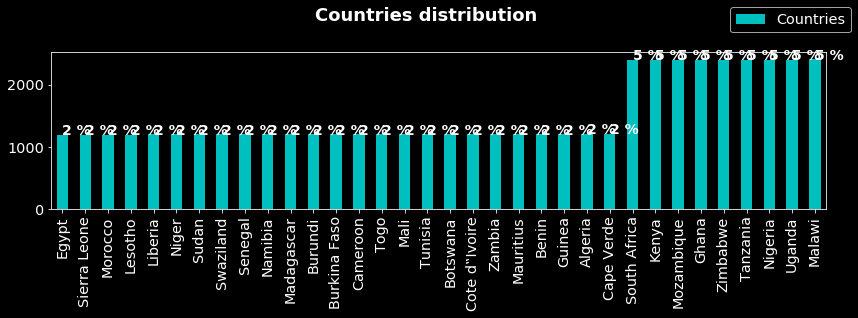

In [8]:
# Visualization of Country distribution
plotting.visualize([countries],
                   countries_label,
                   'Countries distribution',
                   direction='V'
                   )

From the figure above, one could note that there are two groups of countries that have approximately the same repartition. The one with a ratio of 5% (Kenya, South Africa, Ghana, Tanzania, Mozambique, Uganda, Nigeria and Malawi) and the other countries having a ratio of 2%.

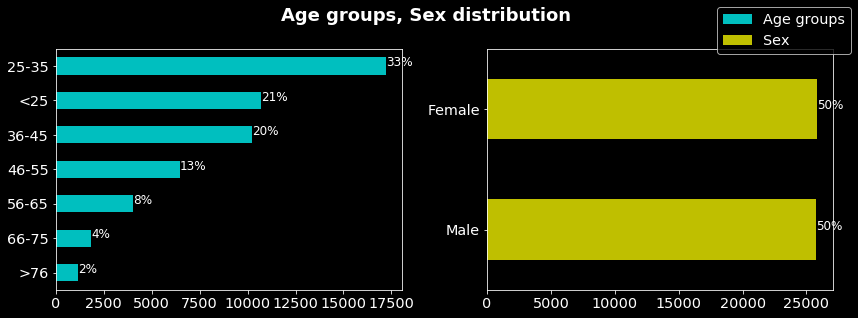

In [9]:
# Visualization of Country age groups and sex distribution
plotting.visualize(age_groups_and_sex,
                age_groups_sex_labels,
                'Age groups, Sex distribution'
                )

From the figure above, one could see that the sex is equaly distributed contrary to the age groups in which the age group 25-35 is the most represented and >76 the least.

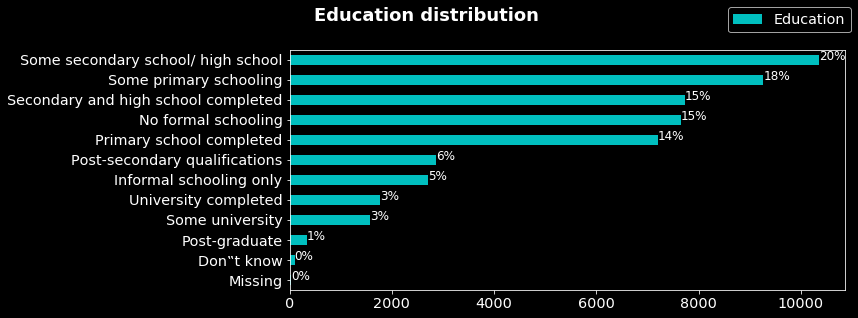

In [10]:
# Visualization of education level distribution
plotting.visualize([education], education_label, 'Education distribution')

20% of people in the sample accomplished some secondary and high school and only 3% achieved a complete university curriculum.

### Visualisation of most frequent types of bribes by country

Questions Q61A to Q61F refer to the types of bribes the interviewed persons experienced in the past. Here are the descriptions of each question:
* Q61A: In the past year, how often, (if ever, have you had to pay a bribe, give a gift, or do a favor to
       government officials in order to: Get a document or a permit)?
* Q61B: In the past year, how often, if ever, have you had to pay a bribe, give a gift, or do a favor to
    government officials in order to: Get water or sanitation services?
* Q61C: In the past year, how often, if ever, have you had to pay a bribe, give a gift, or do a favor to
    government officials in order to: Get treatment at a local health clinic or hospital?
* Q61D: In the past year, how often, if ever, have you had to pay a bribe, give a gift, or do a favor to
    government officials in order to: Avoid a problem with the police (like passing a checkpoint or avoiding a
    fine or arrest)?
* Q61E: In the past year, how often, if ever, have you had to pay a bribe, give a gift, or do a favor to
    government officials in order to: Get a place in a primary school for a child?
* Q61F: And during the last national election in 20xx, how often, if ever did a candidate or someone
    from a political party offer you something, like food or a gift or money, in return for your vote?

In [11]:
"""Selecting variables Q61A to Q61F, 
    replacing the missing data by the mode of each column, 
    and encode the responses
"""
df_bribes = df.loc[:, 'Q61A':'Q61F'].copy()
df_bribes = (df_bribes.fillna(df_bribes.mode().loc[0])
                     .replace(constants.RESPONSES_EXPERIENCE_WITH_BRIBERIES,                                   value=None)
              )
df_bribes = df_bribes.replace({
                                'Once or twice': 'At least once',
                                'A few times': 'At least once',
                                'Often': 'At least once'
                                }, value=None
                               )

In [12]:
"""Getting a data frame containing the most
frequent type of bribe by country
"""
types = utils.get_most_corruption_type_by_country(df_bribes, countries)
df_most_corruption_type_by_country = pd.DataFrame(types)
encode_types = {'Avoid problem with police': 0,
                'Document or permit': 1,
                'Election incentives': 2,
                'Treatment at local health clinic or hospital': 3
                }
df_most_corruption_type_by_country.type.replace(encode_types, inplace=True)

In [13]:
# Uncomment to plot the choropleths
"""
utils.plot_choropleth(df=df_most_corruption_type_by_country,
                colorscale='RdBu',
                z=df_most_corruption_type_by_country.type,
                layout_title='Most frequent types of bribes in Africa',                               colorbar_title="Type of bribes",
                tickvals=list(encode_types.values()),
                ticktext =list(encode_types.keys())
                )

utils.plot_choropleth(df=df_most_corruption_type_by_country,
                z=df_most_corruption_type_by_country.percentage,
                layout_title='Bribes frequences',
                colorscale='Rainbow',
                colorbar_title="Frequence",
                tickmode='auto',
                tickvals=list(encode_types.values()),
                ticktext=list(encode_types.values())
                )
"""                

'\nutils.plot_choropleth(df=df_most_corruption_type_by_country,\n                colorscale=\'RdBu\',\n                z=df_most_corruption_type_by_country.type,\n                layout_title=\'Most frequent types of bribes in Africa\',                               colorbar_title="Type of bribes",\n                tickvals=list(encode_types.values()),\n                ticktext =list(encode_types.keys())\n                )\n\nutils.plot_choropleth(df=df_most_corruption_type_by_country,\n                z=df_most_corruption_type_by_country.percentage,\n                layout_title=\'Bribes frequences\',\n                colorscale=\'Rainbow\',\n                colorbar_title="Frequence",\n                tickmode=\'auto\',\n                tickvals=list(encode_types.values()),\n                ticktext=list(encode_types.values())\n                )\n'

In [14]:
%%html
Please note that the two choropleth figures will not be displayed as output once the notebook in imported, so I'll put them manually.

<img src='https://raw.githubusercontent.com/abdjiber/Election-corruption-in-Africa/master/img/figures/choropleth_types_bribes.png'>

<img src='https://raw.githubusercontent.com/abdjiber/Election-corruption-in-Africa/master/img/figures/choropleth_types_bribes_frequencies.png.png'>

## data cleansing part 2 : Preparing data for modeling

Here we will set the target variable (Q61F), encode it to string for future plotting labels and drop it from the data frame. We will also fill the missing data by the mode of each variable.

In [15]:
target = df['Q61F']
df = df.fillna(df.mode().loc[0])  # Filling missing

"""
Getting a mask of target values different of -1,
998 and 9 which correspond respectively to missing,
reused to answer and don't know
"""
mask = (target != -1) & (target != 998) & (target != 9)
target = target[mask]
df = df.loc[target.index]
del df['Q61F']  # Deleting the target variable from the data.

In [16]:
target_2_classes = target.replace({0: 0, 1: 1, 2: 1, 3: 1})
target_2_classes.value_counts() / target.shape[0]

0    0.840985
1    0.159015
Name: Q61F, dtype: float64

In [17]:
"""Scaling the data to the range [0, 1]"""
scale = preprocessing.MinMaxScaler()
scale.fit(df)
df_scaled = pd.DataFrame(scale.transform(df), columns=list(df))

# Modeling

## Unsupervised learning

In the unsupervised learning part, we will be using principal components analysis (PCA), and K-means.

### PCA

In [18]:
Pca = decomposition.PCA(n_components=2)
pca = Pca.fit_transform(df_scaled)
components = Pca.components_.T
columns = df.columns
explained_variance_ratio = Pca.explained_variance_ratio_.round(2)

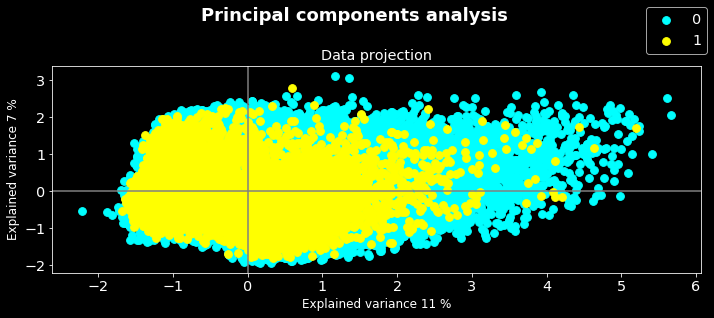

In [19]:
plotting.plot_pca(pca, target_2_classes, explained_variance_ratio,
                  components, columns, figName='Principal components analysis')

### K-means

In [20]:
from sklearn import cluster

The elbow criterion helps to determine the optimal number of clusters when using K-means. 
The process is as follow:
1. Set a list of number of clusters n1, n2, ...
2. Run the K-means using each n
3. For each n, compute the inertia (cost of the objective function)
4. Plot the list on inertia against the list of n
3. The optimal number of clusters will be the n giving an elbow.

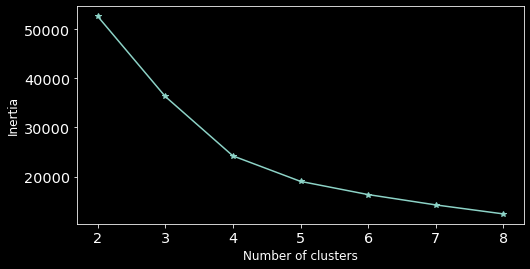

In [21]:
plotting.elbow(pca)

From the figure above, the optimal number of clusters is 4. So we will run the K-means with 4 clusters.

In [22]:
kmeans = cluster.KMeans(n_jobs=-1, n_clusters=4)
pred_labs = kmeans.fit_predict(pca)

No handles with labels found to put in legend.


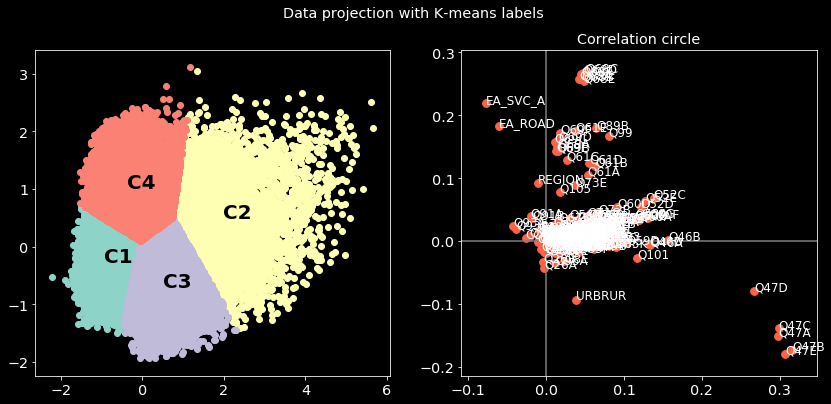

In [23]:
plotting.plot_2D(data=pca, labels=pred_labs, title='Data projection with K-means labels', components=components, columns=columns)

We can note that the clusters have different size. C2 has the biggest one, C4 and 3 have approximately the same size and 
C1 the smallest one. Once we obtained the clusters we can compare them on some variables. Here I choosed to do the comparision on:
* Q1: Age
* Q101: Sex
* Q97: Education level
* Q61A to Q61F: type of experienced corruption
* COUNTRY_ALPHA: Countries

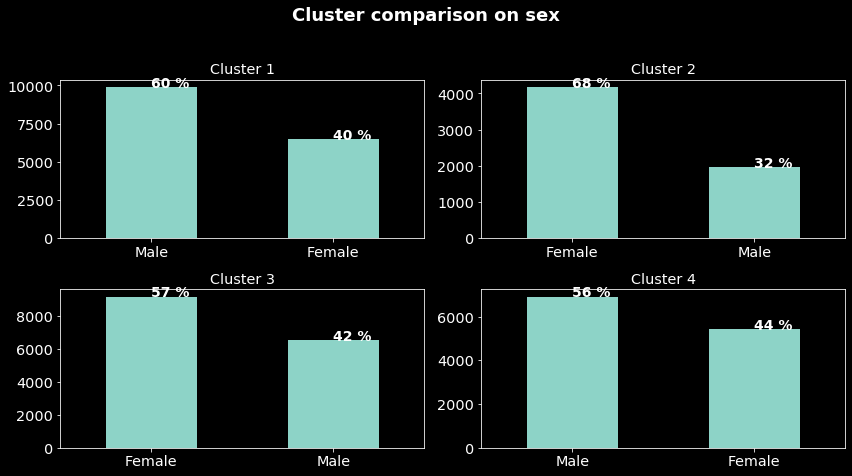

In [24]:
plotting.compare_clusters(df, pred_labs, {'Q101':'Cluster comparison on sex'})

Mean age cluster 1: 36.67
Mean age cluster 2: 40.22
Mean age cluster 3: 37.99
Mean age cluster 4: 35.59


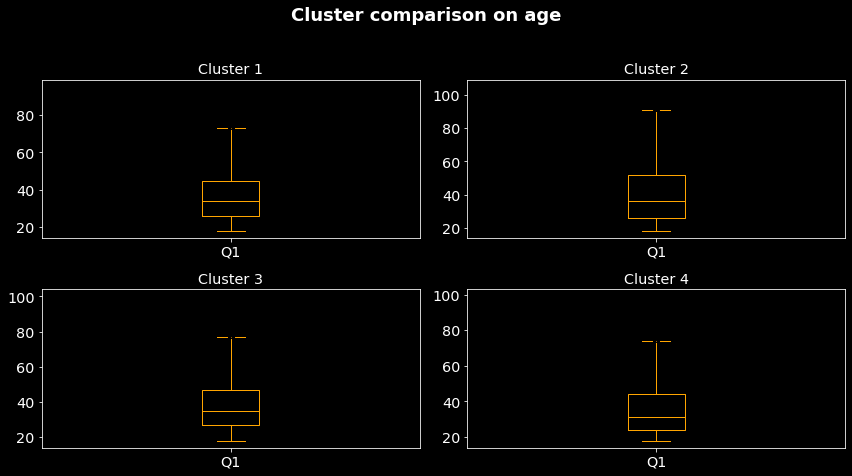

In [25]:
plotting.compare_clusters(df, pred_labs, {'Q1': 'Cluster comparison on age'})

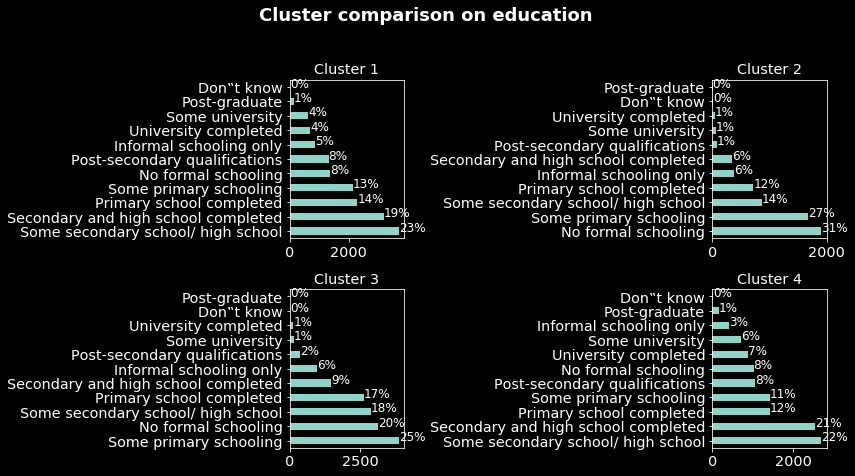

In [26]:
plotting.compare_clusters(df, pred_labs, {'Q97': 'Cluster comparison on education'})

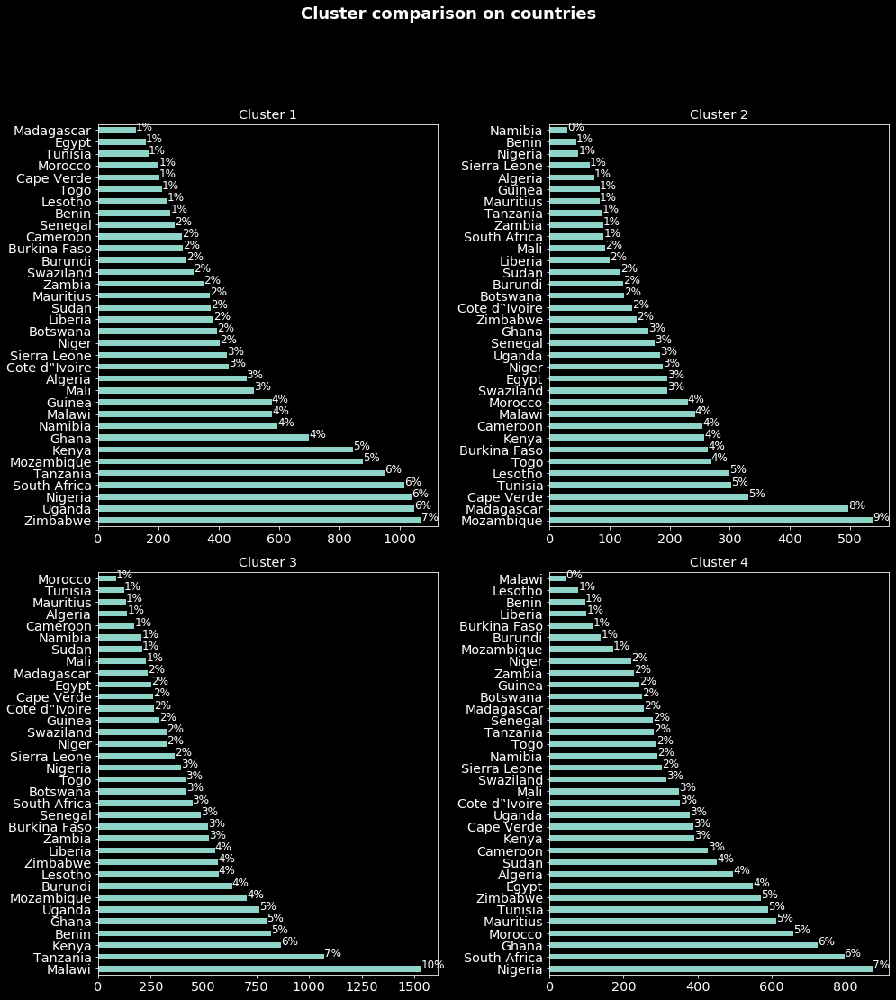

In [27]:
plotting.compare_clusters(df, pred_labs, {'COUNTRY_ALPHA': 'Cluster comparison on countries'})

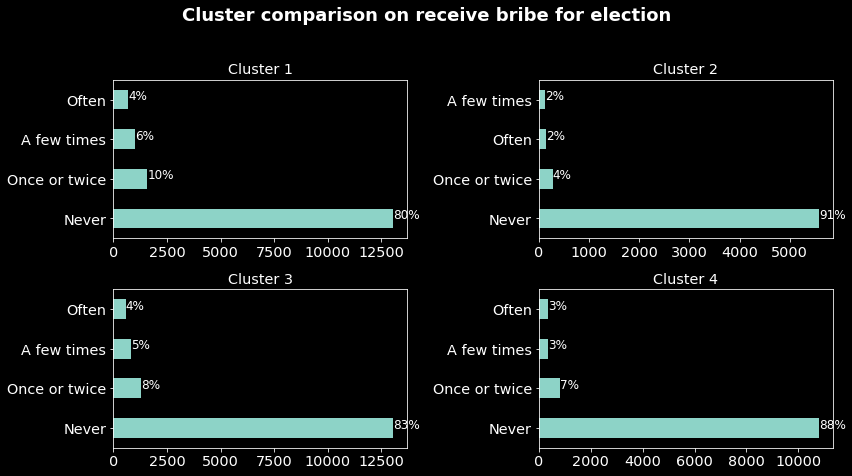

In [28]:
plotting.compare_clusters(target, pred_labs, {'Q61F':'Cluster comparison on receive bribe for election'})

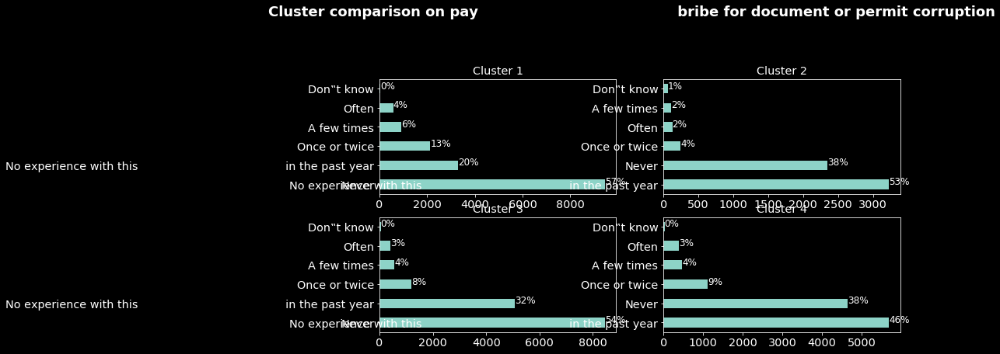

In [29]:
plotting.compare_clusters(df, pred_labs, {'Q61A': 'Cluster comparison on pay                                         bribe for document or permit corruption'})

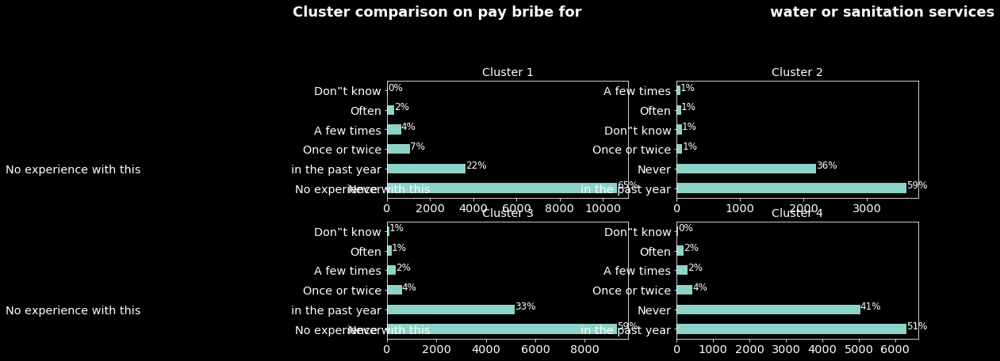

In [30]:
plotting.compare_clusters(df, pred_labs, {'Q61B': 'Cluster comparison on pay bribe for                                      water or sanitation services'})

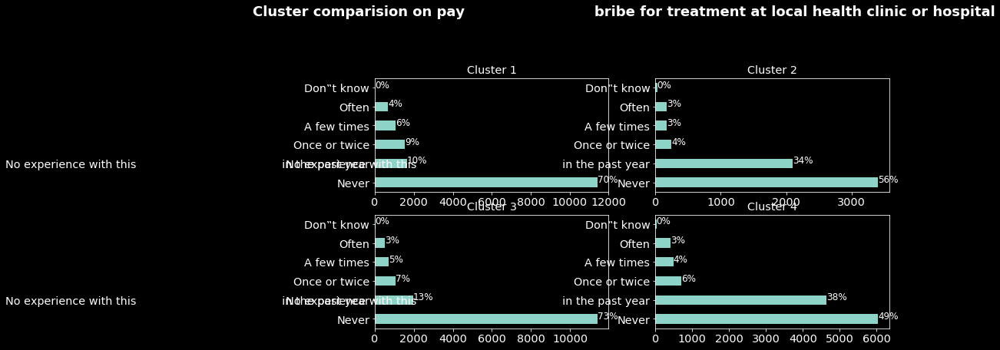

In [31]:
plotting.compare_clusters(df, pred_labs, {'Q61C': 'Cluster comparision on pay                           bribe for treatment at local health clinic or hospital'})

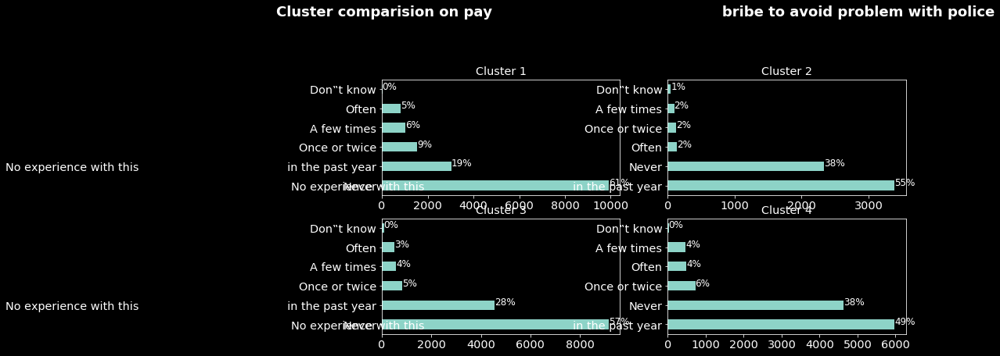

In [32]:
plotting.compare_clusters(df, pred_labs, {'Q61D': 'Cluster comparision on pay                                               bribe to avoid problem with police'})

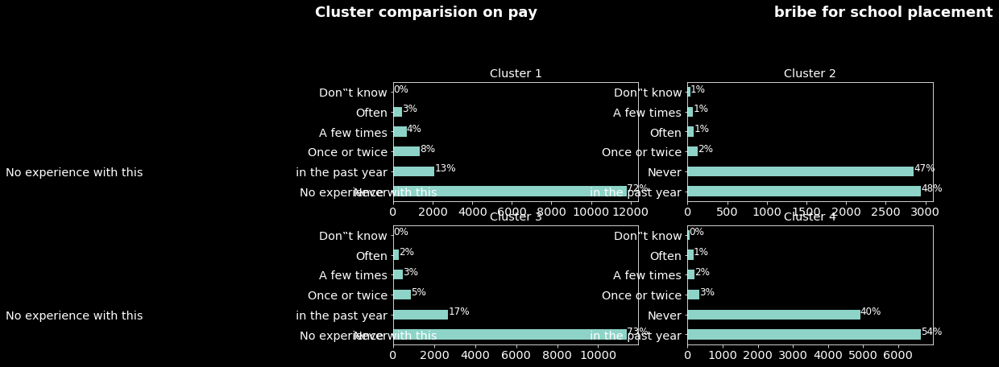

In [33]:
plotting.compare_clusters(df, pred_labs, {'Q61E': 'Cluster comparision on pay                                               bribe for school placement'})

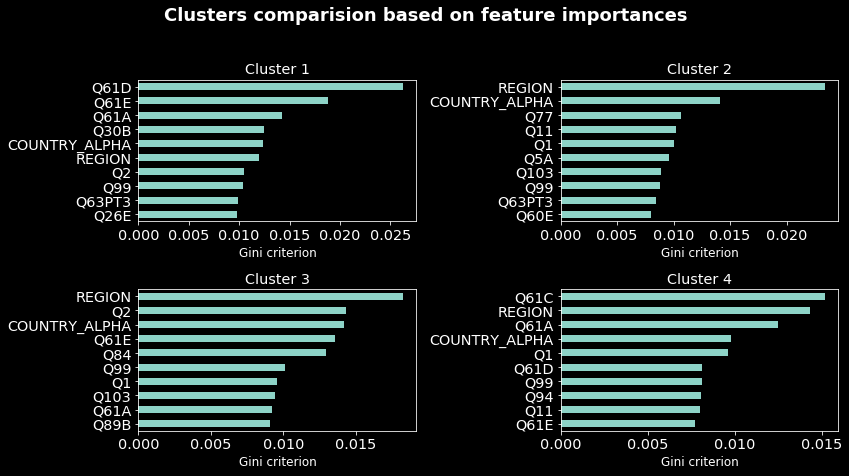

In [34]:
plotting.plot_feature_importances(df, target_2_classes, pred_labs)

# Supervised learning

## Importing packages for supervised learning

In [42]:
import lightgbm as lgb
import xgboost as xgb
import catboost as cat
from interpret.glassbox import ExplainableBoostingClassifier
from sklearn.experimental import enable_hist_gradient_boosting
from sklearn.ensemble import HistGradientBoostingClassifier

## Feature engineering

For the supervised learning, I used two common technics on categorical data:
* Counting: Which consist of creating new features by counting the frequences of unique values of each feature.
* Target encoding: Which consist of encoding the data using the target variable.

In [43]:
df_count_encode = utils.count_encoding(df.copy())
df_targ_encoded = utils.target_encode(df_count_encode, target_2_classes)

In [48]:
df_targ_encoded.head()

,COUNTRY_ALPHA,URBRUR,REGION,EA_SVC_A,EA_SVC_B,EA_SVC_C,EA_SVC_D,EA_FAC_A,EA_FAC_B,EA_FAC_C,...,Q97_count,Q98A_count,Q98B_count,Q99_count,Q100_count,Q101_count,Q102_count,Q103_count,Q104_count,Q105_count
0,0.038365,0.179585,0.02,0.138405,0.192636,0.1729,0.159615,0.169369,0.164463,0.1644,...,0.157088,0.156541,0.184615,0.005208,0.149251,0.171847,0.121099,0.119945,0.148175,0.107947
1,0.038365,0.179585,0.02,0.138405,0.192636,0.1729,0.159615,0.169369,0.164463,0.1644,...,0.157088,0.156541,0.184615,0.035211,0.184353,0.146162,0.121099,0.119945,0.169278,0.107947
2,0.038365,0.179585,0.02,0.138405,0.192636,0.1729,0.159615,0.169369,0.164463,0.1644,...,0.157088,0.147521,0.184615,0.148148,0.165464,0.171847,0.121099,0.119945,0.146341,0.098830
3,0.038365,0.179585,0.02,0.138405,0.192636,0.1729,0.159615,0.169369,0.164463,0.1644,...,0.186170,0.156541,0.184615,0.118799,0.130435,0.146162,0.121099,0.119945,0.146341,0.098830
4,0.038365,0.179585,0.02,0.138405,0.192636,0.1729,0.159615,0.169369,0.164463,0.1644,...,0.152663,0.156541,0.155778,0.164650,0.162133,0.171847,0.121099,0.119945,0.169278,0.129293


## Splitting the data into train and validation sets

In [44]:
x_train, x_val, y_train, y_val = utils.split(df_targ_encoded, target_2_classes)

In [45]:
models_common_params_GBM = dict(random_state=constants.RANDOM_STATE, verbose=0)

## Defining models

We will be using 6 models:
* LightGBM
* XGBoost
* CatBoost
* 2 layers Neural Nets
* Explainable Boosting Classifier
* Hist Gradient Boosting Classifier

In [46]:
clf_lgb = lgb.LGBMClassifier(**models_common_params_GBM)    
clf_xgb = xgb.XGBClassifier(**models_common_params_GBM)
clf_cat = cat.CatBoostClassifier(**models_common_params_GBM)
nn = neural_nets.NeuralNets(x_train, x_val, y_train, y_val)
clf_int = ExplainableBoostingClassifier(random_state=constants.RANDOM_STATE)
clf_hist = HistGradientBoostingClassifier(random_state=constants.RANDOM_STATE)
list_models = {'LightGBM': clf_lgb, 'XGBoost': clf_xgb,
               'CatBoost': clf_cat, 'Neural Nets': nn,
               'Explainable Boosting': clf_int,
               'Hist Gradient boosting': clf_hist
               }

1:57: W291 trailing whitespace
8:55: W291 trailing whitespace


In [51]:
# Defining an instance of the classification class 
classifiers = classification.Classification(list_models,
                                            x_train, x_val, y_train, y_val)

1:51: W291 trailing whitespace


## Supervised learning

In [114]:
df_scores_supLearning, prediction_supLearning = classifiers.run_supervised_learning()


LightGBM
Accuracy: 0.88
Recall: [0.97 0.41]
AUC: 0.87

XGBoost
Accuracy: 0.87
Recall: [0.97 0.33]
AUC: 0.86

CatBoost
Accuracy: 0.88
Recall: [0.97 0.41]
AUC: 0.87

Neural Nets
Accuracy: 0.87
Recall: [0.97 0.33]
AUC: 0.85

Explainable Boosting
Accuracy: 0.87
Recall: [0.97 0.33]
AUC: 0.85

Hist Gradient Boosting
Accuracy: 0.88
Recall: [0.97 0.4 ]
AUC: 0.87


In [115]:
df_scores_supLearning

,Accuracy,Recall,AUC,Execution time (s)
LightGBM,0.88,"[0.97, 0.41]",0.87,12.8425
XGBoost,0.87,"[0.97, 0.33]",0.86,29.6089
CatBoost,0.88,"[0.97, 0.41]",0.87,81.6276
Neural Nets,0.87,"[0.97, 0.33]",0.85,40.3901
Explainable Boosting,0.87,"[0.97, 0.33]",0.85,395.989
Hist Gradient Boosting,0.88,"[0.97, 0.4]",0.87,13.5886


## Semi supervised learning

In [116]:
df_scores_supLearning, prediction_supLearning = classifiers.run_semi_supervised_learning()


LightGBM
Accuracy: 0.88
Recall: [0.97 0.4 ]
AUC: 0.87

XGBoost
Accuracy: 0.87
Recall: [0.97 0.33]
AUC: 0.86

CatBoost
Accuracy: 0.88
Recall: [0.97 0.41]
AUC: 0.87

Neural Nets
Accuracy: 0.87
Recall: [0.96 0.37]
AUC: 0.85

Explainable Boosting
Accuracy: 0.87
Recall: [0.97 0.33]
AUC: 0.85

Hist Gradient Boosting
Accuracy: 0.88
Recall: [0.97 0.4 ]
AUC: 0.87


In [117]:
df_scores_supLearning

,Accuracy,Recall,AUC,Execution time (s)
LightGBM,0.88,"[0.97, 0.4]",0.87,12.8427
XGBoost,0.87,"[0.97, 0.33]",0.86,29.039
CatBoost,0.88,"[0.97, 0.41]",0.87,85.6576
Neural Nets,0.87,"[0.96, 0.37]",0.85,43.7128
Explainable Boosting,0.87,"[0.97, 0.33]",0.85,346.769
Hist Gradient Boosting,0.88,"[0.97, 0.4]",0.87,14.151


In [126]:
model, oof,  = utils.CV(clf_lgb, df_targ_encoded, target_2_classes)

Fold 1 auc 0.848097034075501
Fold 2 auc 0.8562664117501894
Fold 3 auc 0.8656549345727653
Fold 4 auc 0.8273252027192398
Fold 5 auc 0.8420925769545856
Time compexity 66.27096772193909


In [127]:
scoring.scores(target_2_classes,  np.where(oof < 0.5, 0, 1), oof)

Accuracy: 0.86
Recall: [0.96 0.34]
AUC: 0.85


(0.86, array([0.96, 0.34]), 0.85)